In [1]:
import os
import json
import glob
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

from preprocessing.organ_labels import organ_labels, selected_organ_labels

In [2]:
DATA_SPLIT_FILE = '/home/kats/storage/staff/eytankats/data/nako_10k/nako_dataset_split.json'
LABELS_FILE = '/home/kats/storage/staff/eytankats/data/nako_10k/labels_aggregated.json'
IMAGES_DIR = '/home/kats/storage/staff/eytankats/data/nako_10k/images_depth'
MASKS_DIR = '/home/kats/storage/staff/eytankats/data/nako_10k/masks_projection'

In [3]:
print(f'{len(organ_labels)} labels:')
for label in organ_labels:
    print(f' - {label}')

85 labels:
 - spleen
 - kidney_right
 - kidney_left
 - gallbladder
 - liver
 - stomach
 - pancreas
 - lung_upper_lobe_left
 - lung_lower_lobe_left
 - lung_upper_lobe_right
 - lung_middle_lobe_right
 - lung_lower_lobe_right
 - trachea
 - thyroid_gland
 - small_bowel
 - duodenum
 - colon
 - urinary_bladder
 - prostate
 - sacrum
 - vertebrae_S1
 - vertebrae_L5
 - vertebrae_L4
 - vertebrae_L3
 - vertebrae_L2
 - vertebrae_L1
 - vertebrae_T12
 - vertebrae_T11
 - vertebrae_T10
 - vertebrae_T9
 - vertebrae_T8
 - vertebrae_T7
 - vertebrae_T6
 - vertebrae_T5
 - vertebrae_T4
 - vertebrae_T3
 - vertebrae_T2
 - vertebrae_T1
 - vertebrae_C7
 - vertebrae_C6
 - vertebrae_C5
 - heart
 - aorta
 - brachiocephalic_trunk
 - common_carotid_artery_right
 - common_carotid_artery_left
 - humerus_left
 - humerus_right
 - scapula_left
 - scapula_right
 - clavicula_left
 - clavicula_right
 - femur_left
 - femur_right
 - hip_left
 - hip_right
 - rib_left_1
 - rib_left_2
 - rib_left_3
 - rib_left_4
 - rib_left_5
 -

In [4]:
data_split = json.load(open(DATA_SPLIT_FILE))
for partition in ['training','validation','test']:
    images_paths = glob.glob(os.path.join(IMAGES_DIR, partition, '*.png'))
    masks_paths = glob.glob(os.path.join(MASKS_DIR, partition, organ_labels[0],'*.png'))

    print(f'Original number of images for {partition} : {len(data_split[partition])}')
    print(f'Number of pre-processed images for {partition}: {len(images_paths)}')
    print(f'Number of pre-processed masks for {partition}: {len(masks_paths)}\n')

Original number of images for training : 8969
Number of pre-processed images for training: 8967
Number of pre-processed masks for training: 8926

Original number of images for validation : 527
Number of pre-processed images for validation: 527
Number of pre-processed masks for validation: 523

Original number of images for test : 1055
Number of pre-processed images for test: 1055
Number of pre-processed masks for test: 1053



Number of the original images in training/validation/test and number of preprocessed images and masks differs because:
  - some of the images cannot be opened by `nibabel` and skipped during preprocessing.
  - some of the masks are missing.

In [5]:
images_paths = glob.glob(os.path.join(IMAGES_DIR, 'training', '*.png'))
selected_images_paths = np.random.choice(images_paths, 10, replace=False)

print('Selected images:')
for image_path in selected_images_paths:
    print(f' - {os.path.basename(image_path)}')

Selected images:
 - 104208.png
 - 109017.png
 - 108001.png
 - 105940.png
 - 103324.png
 - 104472.png
 - 110794.png
 - 108902.png
 - 103059.png
 - 107709.png


In [6]:
def get_depth_img_with_organs(image_rgb, mask_gray, alpha=0.5):

    mask_gray_np = np.array(mask_gray)
    mask_rgb = np.zeros((mask_gray_np.shape[0], mask_gray_np.shape[1], 3))
    mask_rgb[:, :, 0] = mask_gray_np

    blended_image = np.array(image_rgb) * (1 - alpha) + mask_rgb * alpha
    blended_image = np.rot90(blended_image)
    blended_image = np.uint8(blended_image)

    return blended_image

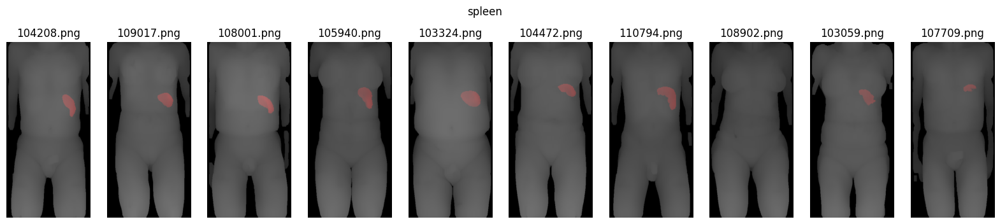

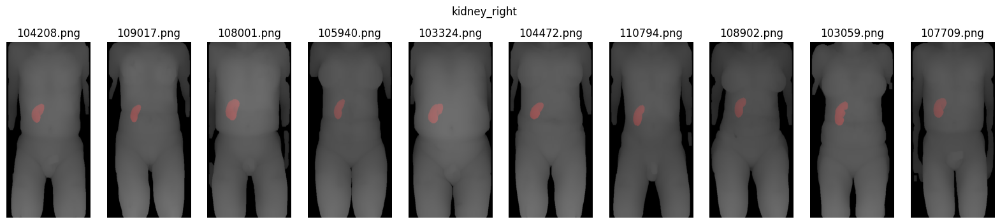

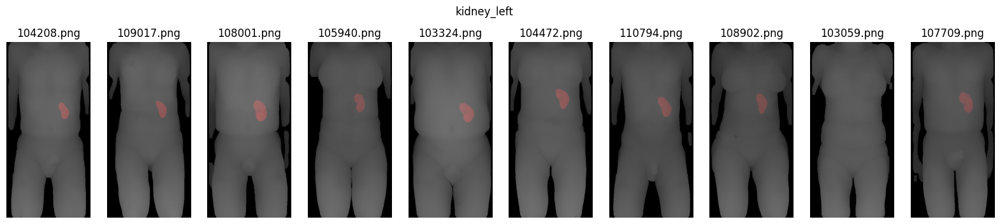

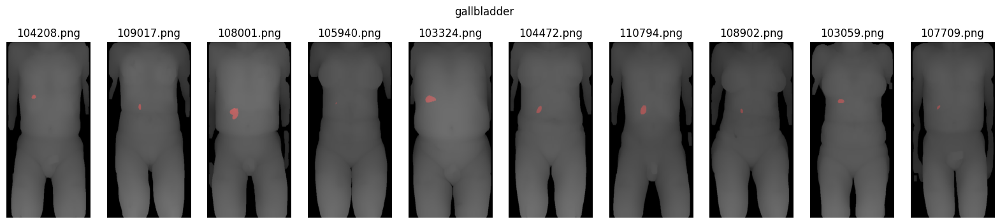

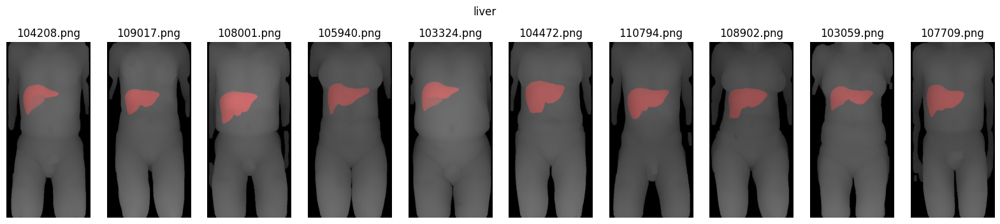

...

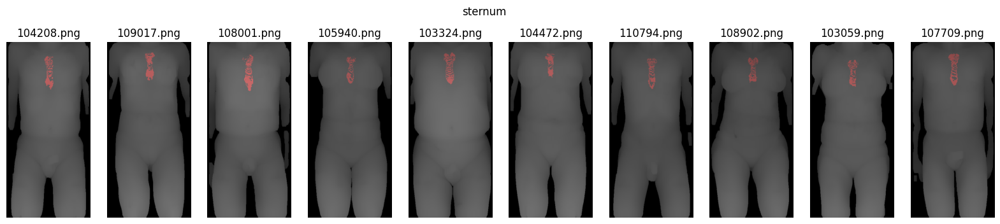

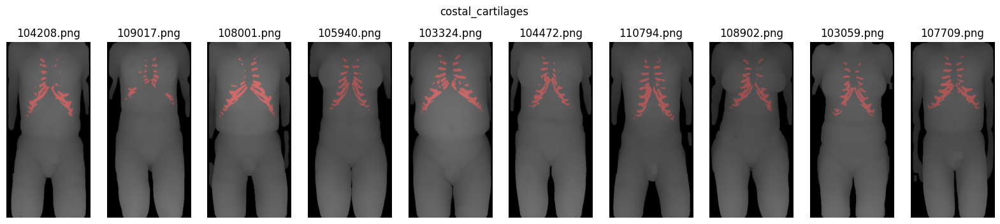

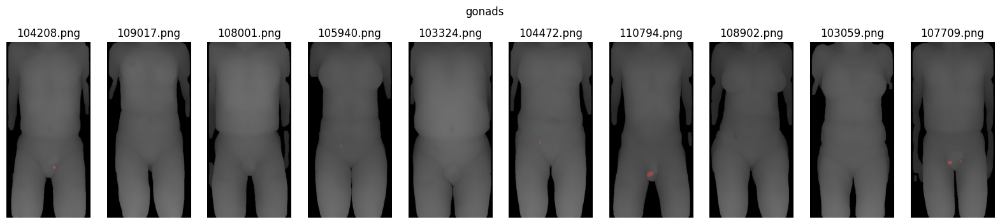

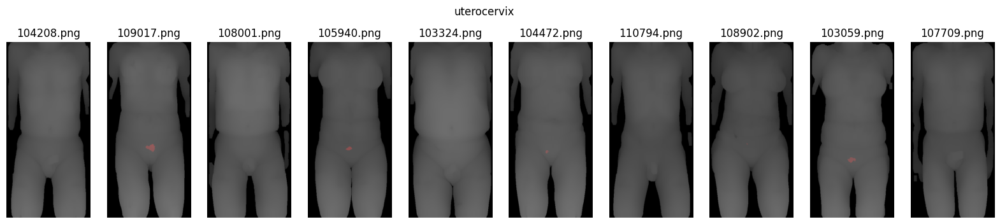

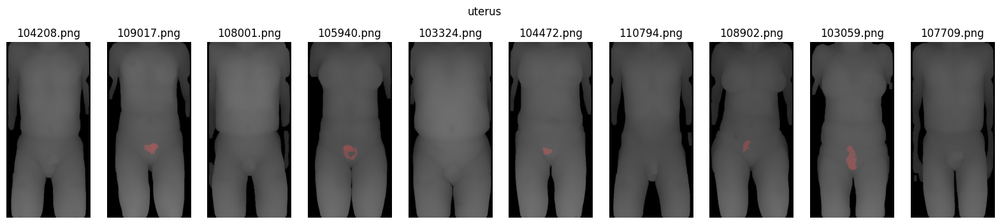

In [7]:
for label in organ_labels:
    fig, ax = plt.subplots(1, len(selected_images_paths), figsize=(20, 4))
    for idx, image_path in enumerate(selected_images_paths):
        img = Image.open(image_path).convert("RGB")
        mask = Image.open(os.path.join(MASKS_DIR, 'training', label, os.path.basename(image_path)))

        blended_image = get_depth_img_with_organs(img, mask)

        ax[idx].imshow(blended_image)
        ax[idx].axis('off')
        ax[idx].set_title(os.path.basename(image_path))

    fig.suptitle(f'{label}')
    plt.show()
    plt.close()



The data should be filtered based on quality criteria of the labels:
1. Select labels of sufficient quality based on visual assesment.
2. Filter out data samples for which at least one of the selected organs is missing.
3. Filter out data samples for which at least one of the selected organs has more than one connected components.
4. Filter out data samples for which at least one of the selected organs in 5% of the smallest organ sizes.

Farther pre-processing of masks for training partition:
- Fill holes: the final goal is bounding box and holes in masks can possibly confuse training process.
- Smooth organ boundaries (probably by morphological operators): prediction of exact boundaries based on depth masks is hardly possible.

In [9]:
print(f'{len(selected_organ_labels)} labels:')
for label in selected_organ_labels:
    print(f' - {label}')

25 labels:
 - spleen
 - kidney_right
 - kidney_left
 - gallbladder
 - liver
 - stomach
 - pancreas
 - trachea
 - urinary_bladder
 - sacrum
 - vertebrae_S1
 - vertebrae_L5
 - vertebrae_L4
 - vertebrae_L3
 - vertebrae_L2
 - vertebrae_L1
 - vertebrae_T12
 - vertebrae_T11
 - aorta
 - clavicula_left
 - clavicula_right
 - femur_left
 - femur_right
 - hip_left
 - hip_right


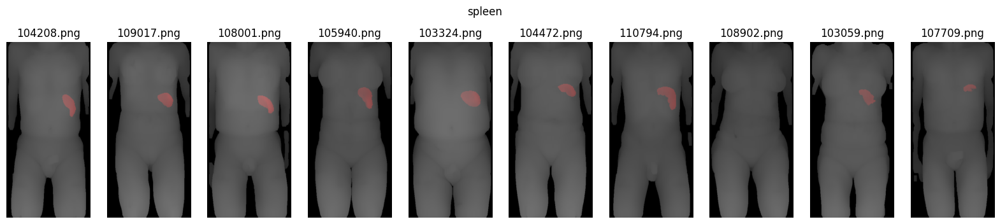

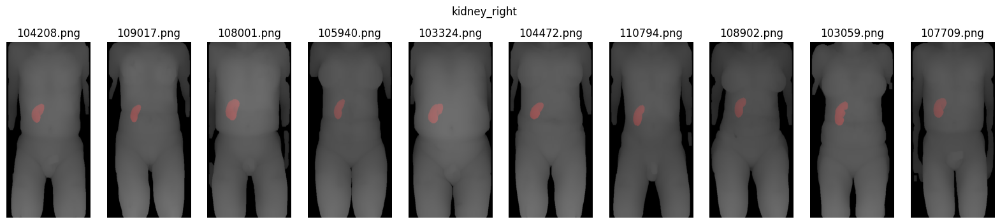

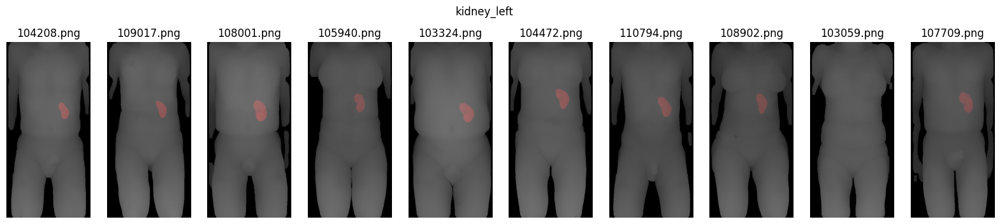

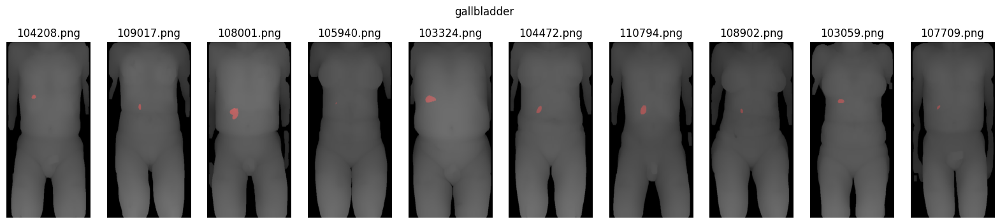

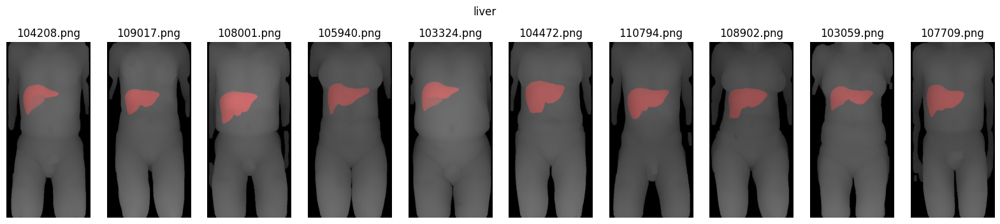

...

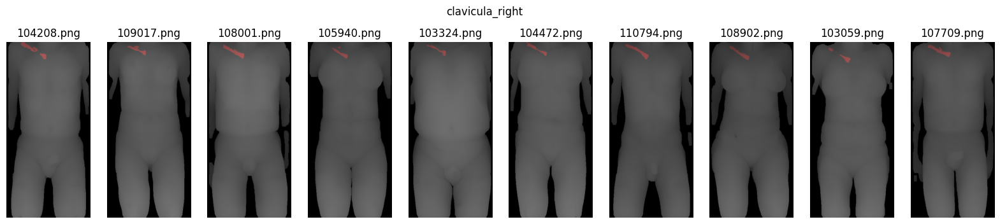

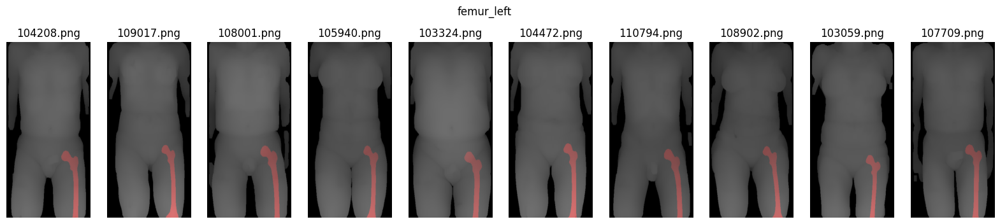

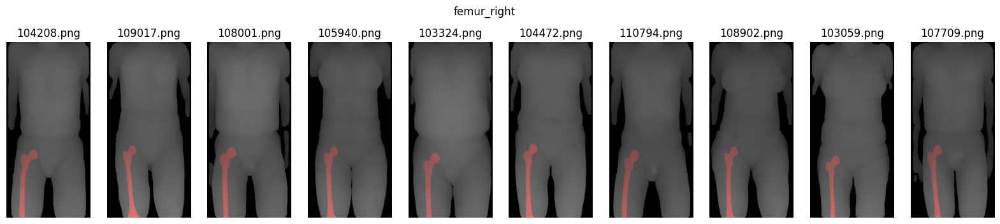

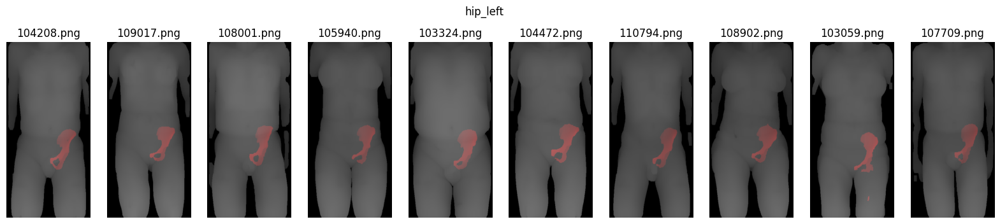

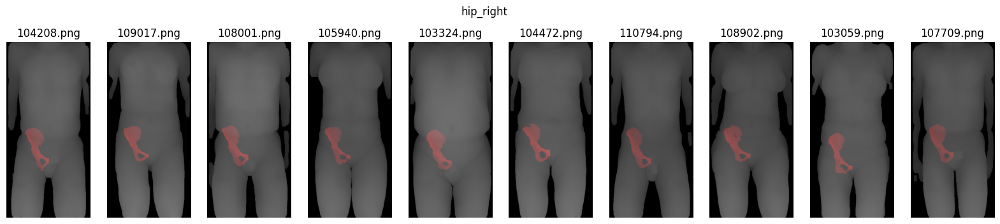

In [10]:
for label in selected_organ_labels:
    fig, ax = plt.subplots(1, len(selected_images_paths), figsize=(20, 4))
    for idx, image_path in enumerate(selected_images_paths):
        img = Image.open(image_path).convert("RGB")
        mask = Image.open(os.path.join(MASKS_DIR, 'training', label, os.path.basename(image_path)))

        blended_image = get_depth_img_with_organs(img, mask)

        ax[idx].imshow(blended_image)
        ax[idx].axis('off')
        ax[idx].set_title(os.path.basename(image_path))

    fig.suptitle(f'{label}')
    plt.show()
    plt.close()